In [1]:

alpha,beta=0.5,0.6
batch_size = 1
batch_size_val=1
init_lr = 0.003
log_epoch=150
epoch_magnifiy,epoch_trouble=160,190
log_hot=150

epochs=1; train_size=None  
grad_accu_times = 2
if train_size==None: opt_step_size=(270/batch_size)*30 
else:opt_step_size=35*(train_size/batch_size)   

gpu_number = "0"            
noisy_sigma = 0.2            
noisy_smooth=2   
noisy_mean=0      

batch_norm=False 

leaky_relu=True;relu=False;elu=False 


weight_decay=1e-4
opt_gamma=0.55           
dropout_toggel,dropblock_toggle=False, True   
dropblock_blocks=5
dropblock_mid=9

dropout_amount=0.3

save_initial='unet_cas_opt'
import os
import torch

os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]=gpu_number
# torch.cuda.set_device(1)
# device = torch.device("cuda:1,2")




from DropBlock3d import DropBlock2D, DropBlock3D,LinearScheduler
import gzip
from sh import gunzip
import numpy as np
import pandas as pd
import gzip
import nibabel as nib
import matplotlib.pyplot as plt
import io
import torch
import torch.utils#.data.Dataset
import glob
#from sklearn.preprocessing import OneHotEncoder 
import imgaug as ia
from imgaug import augmenters as iaa
from torch.autograd import Variable
from torch.utils.data import DataLoader
import torch.nn.functional as F
import numpy as np
from scipy import ndimage as nd
from torch.autograd import Variable
import warnings
warnings.filterwarnings('ignore', '.*output shape of zoom.*')
import warnings
warnings.filterwarnings('ignore')
from random import shuffle
from scipy.ndimage import rotate
from numpy import percentile
from skimage.transform import resize



import time
from torch.optim.lr_scheduler import StepLR
import torch as torch
from skimage import exposure
from tensorboardX import SummaryWriter
writer = SummaryWriter()


hgg_dir='/home/Drive3/rahul/MICCAI_BraTS_2018_Data_Training/HGG/'
lgg_dir='/home/Drive3/rahul/MICCAI_BraTS_2018_Data_Training/LGG/'
csv_dir='/home/Drive3/rahul/MICCAI_BraTS_2018_Data_Training/brats.csv'
val_dir='/home/Drive3/rahul/MICCAI_BraTS_2018_Data_Training/brats_val/'

def dice_loss_classes(inpu, target):  # [bs,4,96,96,64]

    ip=inpu[:,0,:,:,:].contiguous().view(-1)
    tar=target[:,0,:,:,:].contiguous().view(-1)
    intersection=(ip * tar).sum() 
    union= ip.sum() + tar.sum()
    score1=1-2*(intersection/union)
    

    ip=inpu[:,1,:,:,:].contiguous().view(-1)
    tar=target[:,1,:,:,:].contiguous().view(-1)
    intersection=(ip * tar).sum() 
    union= ip.sum() + tar.sum()
    score2=1-2*(intersection/union)
     
    
    return score1,score2



In [5]:
np.random.uniform(0,1,1)[0]

0.6239226154112226

In [9]:
# def dummy(x): return(x)
def classify_label(msk): 
    v=np.zeros((msk.size()[-1],3))
    for i in range(msk.size()[-1]):
        if (msk[:,:,i]==1).any(): v[i,0]=1
        if (msk[:,:,i]==2).any(): v[i,1]=1
        if (msk[:,:,i]==3).any(): v[i,2]=1
    return(torch.tensor(v).transpose(0,1)) # instead of trans can v->(3,size)

def noisy(image): 

    row,col,ch= image.shape   
    gauss = np.random.normal(noisy_mean,noisy_sigma,(row,col,ch))
    gauss = gauss.reshape(row,col,ch)
    noisy = image + gauss
    noisy = nd.gaussian_filter(noisy, sigma=(noisy_smooth, noisy_smooth, noisy_smooth), order=0)

    return noisy


def standardizer(img,mod):

    if mod==0:mean=233.581878; std=204.35788
    elif mod==1:mean=599.1488; std=547.67474
    elif mod==2:mean=506.3251647; std=533.85250
    else: mean=388.70568; std=378.741204

    img=img-mean
    img=img/std
   
    quartiles = percentile(img, [99.5])  # exact region
    quartiles2 = percentile(img, [0.05]) 

    img=np.clip(img,quartiles2[0],quartiles[0])

    return(img)

pad=torch.nn.ConstantPad2d(1,0)
def padder(img): 
    
    padded=pad(img.transpose(3,4).transpose(2,3))[:,:,:,:-1,:-1]
    return(padded.transpose(2,3).transpose(3,4))
      

def one_hot(a):
    g1=a[:,:,:]==0
    g2=a[:,:,:]==1
    # g3=a[:,:,:]==2
    # g4=a[:,:,:]==3
    return torch.stack((g1,g2),0)

seq = iaa.Sequential([  iaa.Fliplr(1),iaa.Flipud(1) ])
seq2 = iaa.Fliplr(1)
seq3 = iaa.Flipud(1)

def read_img(flair,t1,t1ce,t2,seg):
            try:flair = np.load(flair)[15:143,40:212,30:202]
            except: # string error in val 'B' missing from start
                l=[flair,t1,t1ce,t2,seg]
                for i in range(len(l)):
                    s=l[i].split('/')
                    s[-1]='B'+s[-1]
                    l[i]='/'.join(s)
                flair,t1,t1ce,t2,seg=l
                flair=np.load(flair)[15:143,40:212,30:202]

            t1 = np.load(t1)[15:143,40:212,30:202]
            t1ce = np.load(t1ce)[15:143,40:212,30:202]
            t2 = np.load(t2)[15:143,40:212,30:202]
            
            seg = np.array(nib.load(seg).dataobj)[40:212,30:202,15:143] 
#             print(np.unique(seg), '1') 
            
            seg= np.flipud(rotate(seg, 90, reshape=False)).copy()
#             seg=np.swapaxes(np.swapaxes(seg,1,2),1,0)
            
#             print(np.unique(seg), '2') 
            
            seg[seg==4]=3
            seg=(seg==4)+(seg==2)+(seg==1)+(seg==3) # combine
            
#             print(np.unique(seg), '3') 
            
            flair=standardizer(flair,mod=0) ; t1=standardizer(t1,mod=1); t1ce=standardizer(t1ce,mod=2); t2=standardizer(t2,mod=3)
#             print(type(flair))
            flair=noisy(flair) ; t1=noisy(t1); t1ce=noisy(t1ce); t2=noisy(t2)

            concat_full=np.concatenate([flair,t1,t1ce,t2],axis=0)
            concat_full=torch.tensor(concat_full).transpose(0,1).transpose(1,2).unsqueeze(3)

            rand=np.random.choice([0,1,2,3,4])
#             print(np.shape(seg))
            if rand==0: 
                concat_full=seq.augment_images((np.array(concat_full)))
                seg_orig=torch.tensor( seq.augment_images((np.array(seg).astype(int)))      )
            elif rand==1:
                concat_full=seq2.augment_images((np.array(concat_full)))
                seg_orig=torch.tensor( seq2.augment_images((np.array(seg).astype(int)))      )
            elif rand==2:
                concat_full=seq3.augment_images((np.array(concat_full)))
                seg_orig=torch.tensor( seq3.augment_images((np.array(seg).astype(int)))      )
            else:seg_orig=torch.tensor(seg.astype(int))
            

            flair=torch.tensor(concat_full[:,:,:128,0])
            t1=torch.tensor(concat_full[:,:,128:256,0])
            t1ce=torch.tensor(concat_full[:,:,256:384,0])
            t2=torch.tensor(concat_full[:,:,384:512,0])

            img=np.stack([flair,t1,t1ce,t2])

        
            seg=one_hot(seg_orig) 
            classify=0

            return(img,seg,seg_orig,classify)



class BraTS_FLAIR_val(torch.utils.data.Dataset):  # Validation dataset getter
 

    def __init__(self, csv_file, root_dir, transform=None):  
        self.paths = glob.glob('/home/Drive3/rahul/MICCAI_BraTS_2018_Data_Training/brats_val/**')
        self.root_dir = root_dir
        self.transform = transform
    def __len__(self):
        return len(self.paths)
    def __getitem__(self, idx): 
        
        flair=self.paths[idx]+'/'+str(self.paths[idx])[-16:]+'_flairB.npy'  # image files location
        t1=self.paths[idx]+'/'+str(self.paths[idx])[-16:]+'_t1B.npy'
        t1ce=self.paths[idx]+'/'+str(self.paths[idx])[-16:]+'_t1ceB.npy'
        t2=self.paths[idx]+'/'+str(self.paths[idx])[-16:]+'_t2B.npy'        
        seg=self.paths[idx]+'/'+str(self.paths[idx])[-16:]+'_seg.nii'
        
        
        print('Val: ',str(self.paths[idx])[-16:])
        eg_name=str(self.paths[idx])[-16:]
        img,seg,seg_orig,classify=read_img(flair=flair,t1=t1,t1ce=t1ce,t2=t2,seg=seg)

        sup_block3=resize(np.array(seg_orig),[172/4, 172/4, 128/4],order=0,mode='constant', preserve_range=True)
        sup_block3=torch.tensor(sup_block3) 
        one_hot_b3=one_hot(sup_block3)#.transpose(0,1) 

        sup_block4=resize(np.array(seg_orig),[172/2, 172/2, 128/2],order=0,mode='constant', preserve_range=True)
        sup_block4=torch.tensor(sup_block4)
        one_hot_b4=one_hot(sup_block4)#.transpose(0,1) 

        sample = {'img': torch.from_numpy(img), 'mask': seg.type(torch.ByteTensor),'seg_orig':seg_orig.type(torch.ByteTensor),'eg_name':eg_name,'classify':classify,
        'sup_block3':sup_block3,'one_hot_b3':one_hot_b3,'sup_block4':sup_block4,'one_hot_b4':one_hot_b4}
        
        if self.transform:
            sample = self.transform(sample)

        return sample

class BraTS_FLAIR(torch.utils.data.Dataset):


    def __init__(self, csv_file, root_dir, transform=None,train_size=train_size):  
        self.root_dir = root_dir
        self.transform = transform

        self.hggs=glob.glob(hgg_dir+'*')
        self.lggs=glob.glob(lgg_dir+'*')
        self.brats=self.hggs+self.lggs

        shuffle(self.brats)

        if train_size: self.brats=self.brats[:train_size]  #  chosen subset
        
          

    def __len__(self):                                    
        return len(self.brats)

    def __getitem__(self, idx): 
        folder=self.brats[idx]

        flair=self.brats[idx]+'/'+self.brats[idx][55:]+'_flairB.npy'  # image files location
        t1=self.brats[idx]+'/'+self.brats[idx][55:]+'_t1B.npy'
        t1ce=self.brats[idx]+'/'+self.brats[idx][55:]+'_t1ceB.npy'
        t2=self.brats[idx]+'/'+self.brats[idx][55:]+'_t2B.npy'
        seg=self.brats[idx]+'/'+self.brats[idx][55:]+'_seg.nii'

        print('Train: ',self.brats[idx][55:])
        eg_name=self.brats[idx][55:]
        

        img,seg,seg_orig,classify= read_img(flair=flair,t1=t1,t1ce=t1ce,t2=t2,seg=seg)
        
        
        
        sup_block3=resize(np.array(seg_orig),[172/4, 172/4, 128/4],order=0,mode='constant', preserve_range=True)
        sup_block3=torch.tensor(sup_block3) 
        one_hot_b3=one_hot(sup_block3)#.transpose(0,1)#.squeeze(0) 

        sup_block4=resize(np.array(seg_orig),[172/2, 172/2, 128/2],order=0,mode='constant', preserve_range=True)
        sup_block4=torch.tensor(sup_block4)
        one_hot_b4=one_hot(sup_block4)#.transpose(0,1)#.squeeze(0) 
        # print(sup_block3.size(),one_hot_b3.size())
        sample = {'img': torch.from_numpy(img), 'mask': seg.type(torch.ByteTensor),'seg_orig':seg_orig.type(torch.ByteTensor),'eg_name':eg_name,'classify':classify,
        'sup_block3':sup_block3,'one_hot_b3':one_hot_b3,'sup_block4':sup_block4,'one_hot_b4':one_hot_b4}
        
        if self.transform:
            sample = self.transform(sample)

        return sample

 

In [10]:

class my_norm(torch.nn.Module):
    def __init__(self, channels):
        super(my_norm,self).__init__()
        self.norm=torch.nn.BatchNorm3d(channels) if batch_norm==True else torch.nn.InstanceNorm3d(channels, affine=True)

    def forward(self,x): return(self.norm(x))


class my_activation(torch.nn.Module):
    def __init__(self):
        super(my_activation,self).__init__()
        if leaky_relu:
            self.activation=torch.nn.LeakyReLU(inplace=True) 
        if relu:
            self.activation=torch.nn.ReLU(inplace=True) 
        if elu:
            self.activation=torch.nn.ELU(inplace=True) 
    def forward(self,x):return(self.activation(x))
class dummy(torch.nn.Module):
    def __init__(self):
        super(dummy,self).__init__()
        
    def forward(self,x):return(x)




class UNet_down_block(torch.nn.Module):
    def __init__(self, input_channel, output_channel, down_size):
        super(UNet_down_block, self).__init__()
        self.conv1 = torch.nn.Conv3d(input_channel, output_channel, 3, padding=1)
        self.bn1 = my_norm(output_channel) 
        self.conv2 = torch.nn.Conv3d(output_channel, output_channel, 3, padding=1)
        self.bn2 = my_norm(output_channel)
        self.conv3 = torch.nn.Conv3d(output_channel, output_channel, 3, padding=1)
        self.bn3 = my_norm(output_channel)
        self.max_pool = torch.nn.MaxPool3d(2, 2)
        self.relu = my_activation()
        self.down_size = down_size
        if dropout_toggel==True: self.dropout=torch.nn.Dropout3d(dropout_amount)
        if dropblock_toggle==True: self.dropout=LinearScheduler(DropBlock3D(block_size=dropblock_blocks, drop_prob=0.),
                start_value=0.,
                stop_value=0.25,
                nr_steps=5)
        self.dummy=dummy()

    def forward(self, x):
        if self.down_size:
            x = self.max_pool(x)
        x = self.dummy(self.bn1(self.relu(self.conv1(x))))
        residual=x.clone()
        x = self.dummy(self.bn2(self.relu(self.conv2(x))))
        x = self.dummy(self.bn3(self.relu(self.conv3(x))))
        x=x+residual
        return x

class UNet_up_block(torch.nn.Module):
    def __init__(self, prev_channel, input_channel, output_channel):
        super(UNet_up_block, self).__init__()
#         self.up_sampling = torch.nn.functional.interpolate(scale_factor=2, mode='trilinear')
        self.conv1 = torch.nn.Conv3d(prev_channel + input_channel, output_channel, 3, padding=1)
        self.bn1 = my_norm(output_channel)
        self.conv2 = torch.nn.Conv3d(output_channel, output_channel, 3, padding=1)
        self.bn2 = my_norm(output_channel)
        self.conv3 = torch.nn.Conv3d(output_channel, output_channel, 3, padding=1)
        self.bn3 = my_norm(output_channel)
        self.relu = my_activation()
        if dropout_toggel==True: self.dropout=torch.nn.Dropout3d(dropout_amount)
        if dropblock_toggle==True: self.dropout=LinearScheduler(DropBlock3D(block_size=dropblock_blocks, drop_prob=0.),
                start_value=0.,
                stop_value=0.25,
                nr_steps=5)
        self.dummy=dummy()
        self.trans=torch.nn.ConvTranspose3d(input_channel,input_channel,2,2,padding=0)

    def forward(self, prev_feature_map, x):
        # print('before trans',x.size())
        x=self.trans(x)
        try:
            x = torch.cat((x, prev_feature_map), dim=1)
        except:
            x = torch.cat((padder(x), prev_feature_map), dim=1)
            
        x = self.dummy(self.bn1(self.relu(self.conv1(x))))
        residual=x.clone()
        x = self.dummy(self.bn1(self.relu(self.conv2(x))))
        x = self.dummy(self.bn1(self.relu(self.conv3(x))))
        x=x+residual
        return x


class UNet(torch.nn.Module):        # input -> shrunk in 1/2 then transposed at end. Loss can be with orig seg label / shurken if remove transpose
    def __init__(self):
        super(UNet, self).__init__()

        self.preconv=torch.nn.Conv3d(4,4,3,stride=1,padding=1)
        self.preconvb = my_norm(4)
        self.preconv2=torch.nn.Conv3d(4,4,3,stride=1,padding=1)
        self.preconvb2 = my_norm(4)
        self.preconv3=torch.nn.Conv3d(4,4,3,stride=1,padding=1)
        self.preconvb3 = my_norm(4)

        self.firstconv=torch.nn.Conv3d(4,4,3,stride=2,padding=1)
        # self.bn0 = torch.nn.BatchNorm3d(4)
        big=524

        self.down_block1 = UNet_down_block(4, 62, False)
        self.down_block2 = UNet_down_block(62, 124, True)
        self.down_block3 = UNet_down_block(124, 248, True)
        self.down_block4 = UNet_down_block(248, big, True)
        self.max_pool = torch.nn.MaxPool3d(2, 2)

        self.mid_conv1 = torch.nn.Conv3d(big, big, 3, padding=1)
        self.bn1 = torch.nn.BatchNorm3d(big)
        self.mid_conv2 = torch.nn.Conv3d(big, big, 3, padding=1)
        self.bn2 = torch.nn.BatchNorm3d(big)
        self.mid_conv3 = torch.nn.Conv3d(big, big, 3, padding=1)
        self.bn3 = torch.nn.BatchNorm3d(big)

        self.up_block1 = UNet_up_block(big, big, 248)
        self.up_block2 = UNet_up_block(248, 248, 124)
        self.up_block3 = UNet_up_block(124, 124, 62)
        self.up_block4 = UNet_up_block(62, 62, 8)


        self.last_conv1 = torch.nn.Conv3d(12, 8, 3, padding=1) # 12->8 no input concat
        self.last_bn = my_norm(8)
        self.last_conv2 = torch.nn.Conv3d(8, 4, 3, padding=1)
        self.last_bn2= my_norm(4)
        self.relu = my_activation()
        self.last_conv3 = torch.nn.Conv3d(4, 2, 3, padding=1)#made 4-> 2


        self.trans=torch.nn.ConvTranspose3d(8,8,2,2,padding=0)
        self.convt = torch.nn.Conv3d(8, 8, 3, padding=1)
        self.bnt= my_norm(8)

        self.dsb3 = torch.nn.Conv3d(62, 2, 3, padding=1)#made 4-> 2
        self.dsb4 = torch.nn.Conv3d(8, 2, 3, padding=1)#made 4-> 2
        
        # self.class1 = torch.nn.Conv3d(12, 6, 3, padding=1)
        # self.classbn=my_norm(6)
        # self.class2 = torch.nn.Conv3d(6, 3, 3, padding=1)
        # self.avg=torch.nn.AdaptiveMaxPool3d((1,1,128))

         
    def forward(self, x):
#         print('input unet',x.size())
        inputs = x.clone()

        x = self.preconvb(self.relu(self.preconv(x)))
        x = self.preconvb2(self.relu(self.preconv2(x)))
        x = self.preconvb3(self.relu(self.preconv3(x)))

        x=self.relu(self.firstconv(x))
# #         print('first down',x.size())

        self.x1 = self.down_block1(x)
# #         print("Block 1 shape:",self.x1.size())
        self.x2 = self.down_block2(self.x1)
    
# #         print("Block 2 shape:",self.x2.size())
        self.x3 = self.down_block3(self.x2)
# #         print("Block 3 shape:",self.x3.size())
    
        self.x4 = self.down_block4(self.x3)
# #         print("Block 4 shape:",self.x4.size())
    
        self.xmid=self.max_pool(self.x4)
        self.xmid = self.bn1(self.relu(self.mid_conv1(self.xmid)))
        residual=self.xmid.clone()
        self.xmid = self.bn2(self.relu(self.mid_conv2(self.xmid)))
        self.xmid = self.bn3(self.relu(self.mid_conv3(self.xmid)))
        self.xmid = self.xmid + residual
# #         print("Block Mid shape:",self.xmid.size())
        
        x = self.up_block1(self.x4, self.xmid)
# #         print("BlockU 1 shape:",x.size())
        x = self.up_block2(self.x3, x)
# #         print("BlockU 2 shape:",x.size())
        
        b3 = self.up_block3(self.x2, x)
# #         print("BlockU 3 shape:",b3.size())
 
        b4 = self.up_block4(self.x1, b3) #bs,8,86,86,64
# #         print("BlockU 4 shape:",b4.size())
        
        x=  self.trans(b4)   #bs,8,172,172,128  #kernal size is 2
        x = self.bnt(self.relu(self.convt(x)))
        
        x = torch.cat((x, inputs), dim=1) # #bs,12,172,172,128 concat with input  * show x not inps
        
        # classify=self.classbn(self.relu(self.class1(x)))
        # classify=self.class2(classify) #bs,3,172,172,128 
        # pool=self.avg(classify).squeeze(2).squeeze(2)# bs,3,1,1,128->bs,3,128 

        
        
        x = self.last_bn(self.relu(self.last_conv1(x)))
        x = self.last_bn2(self.relu(self.last_conv2(x)))
        x = self.last_conv3(x)
        
        b3=self.dsb3(b3) # supervision
        b4=self.dsb4(b4)
#         print('unet output',x.size())

        return(b3,b4,x)




In [17]:
dsi=iter(BraTS_FLAIR(csv_dir,hgg_dir))

In [18]:

a=next(dsi)

('Train: ', 'Brats18_TCIA03_138_1')


In [19]:
while a['eg_name'] != 'Brats18_TCIA08_218_1': a=next(dsi)

('Train: ', 'Brats18_TCIA10_625_1')
('Train: ', 'Brats18_CBICA_ATV_1')
('Train: ', 'Brats18_CBICA_AQU_1')
('Train: ', 'Brats18_TCIA01_429_1')
('Train: ', 'Brats18_TCIA05_444_1')
('Train: ', 'Brats18_2013_12_1')
('Train: ', 'Brats18_2013_18_1')
('Train: ', 'Brats18_CBICA_ARF_1')
('Train: ', 'Brats18_TCIA05_396_1')
('Train: ', 'Brats18_CBICA_AXO_1')
('Train: ', 'Brats18_TCIA08_242_1')
('Train: ', 'Brats18_TCIA02_135_1')
('Train: ', 'Brats18_CBICA_ASV_1')
('Train: ', 'Brats18_CBICA_ABO_1')
('Train: ', 'Brats18_CBICA_AVV_1')
('Train: ', 'Brats18_TCIA01_147_1')
('Train: ', 'Brats18_TCIA01_190_1')
('Train: ', 'Brats18_TCIA02_283_1')
('Train: ', 'Brats18_TCIA03_296_1')
('Train: ', 'Brats18_TCIA09_402_1')
('Train: ', 'Brats18_TCIA10_330_1')
('Train: ', 'Brats18_CBICA_AXJ_1')
('Train: ', 'Brats18_TCIA08_105_1')
('Train: ', 'Brats18_CBICA_AWH_1')
('Train: ', 'Brats18_2013_26_1')
('Train: ', 'Brats18_TCIA06_184_1')
('Train: ', 'Brats18_TCIA01_231_1')
('Train: ', 'Brats18_TCIA04_479_1')
('Train: '

In [20]:
a['img'].size(),a['mask'].size(),a['seg_orig'].size()

(torch.Size([4, 172, 172, 128]),
 torch.Size([2, 172, 172, 128]),
 torch.Size([172, 172, 128]))

In [21]:
model=UNet().cuda()


In [7]:
def moving_average(data_set, periods=3):
    weights = np.ones(periods) / periods
    return np.convolve(data_set, weights, mode='valid')

data = [1, 2, 3, 6, 9, 12, 20, 28, 30, 25, 22, 20, 15, 12, 10]

ma = moving_average(np.asarray(data), 3)

In [18]:
model_dicts=torch.load('/home/Drive3/rahul/unet_cas_opt-0.11|144',map_location='cpu')
model_dicts.keys()

['Ldc',
 'cross el',
 'optimizer',
 'Ldvc',
 'val',
 'moving loss',
 'state_dict',
 'epoch',
 'biglist',
 'hotlist']

In [23]:
model_dicts['hotlist']

{}

In [22]:
# model = torch.load('/Users/admin/Downloads/model.pth',map_location='cpu')

model_load=torch.load('/home/Drive3/rahul/unet_cas_opt-0.11|144',map_location='cpu')['state_dict']  # get saved weights
model.load_state_dict(model_load) 

In [23]:
# 

8.559800000000001

In [ ]:
Brats18_2013_0_1 - r(0.7059 below missing half in last
                     Brats18_2013_6_1 missing half in 1

In [28]:
a=next(dsi)

('Val: ', 'rats18_2013_10_1')


In [27]:
a['eg_name']

'Brats18_TCIA08_218_1'

In [24]:
gg,b,pred=model(a['img'].unsqueeze(0).float().cuda())

In [25]:
pred.size()

torch.Size([1, 2, 172, 172, 128])

In [26]:

soft_max=torch.nn.Softmax(dim=1)

soft_mask=soft_max(pred)
print(soft_mask.size())

torch.Size([1, 2, 172, 172, 128])


In [27]:

arg=torch.argmax(soft_mask,1)
arg.size()

torch.Size([1, 172, 172, 128])

In [28]:

output=arg.squeeze(0)

In [29]:
output.size(),a['seg_orig'].size()

(torch.Size([172, 172, 128]), torch.Size([172, 172, 128]))

In [30]:

1-dice_loss_classes(soft_mask, a['mask'].unsqueeze(0).float().cuda())[1] # dice score of c2

tensor(0.9439, device='cuda:0', grad_fn=<RsubBackward1>)

In [31]:
# single_patient_two(a['img'],a['seg_orig'])

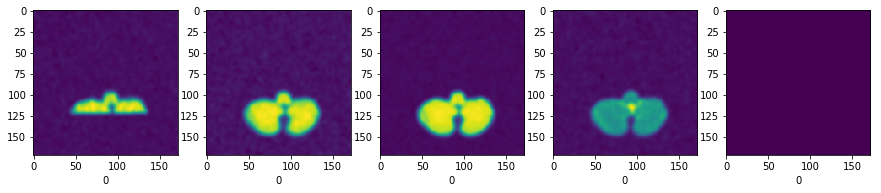

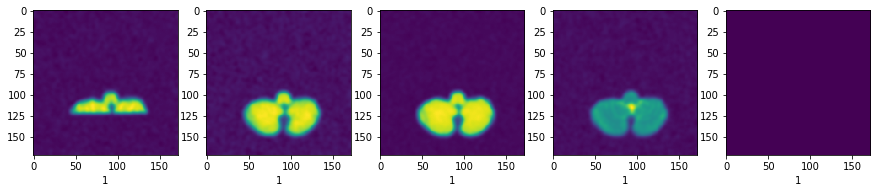

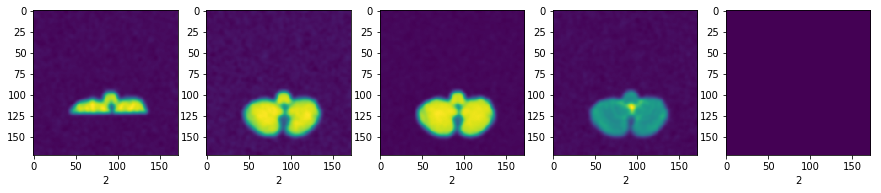

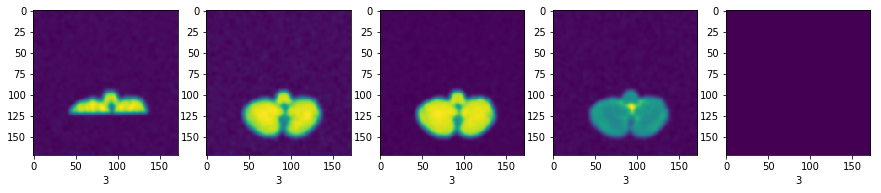

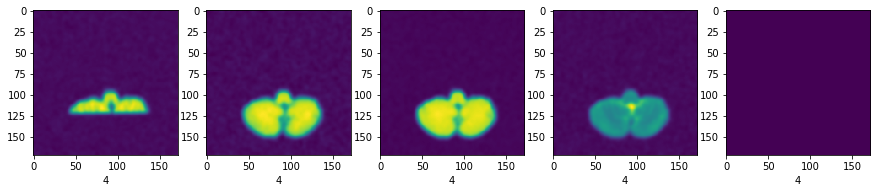

...

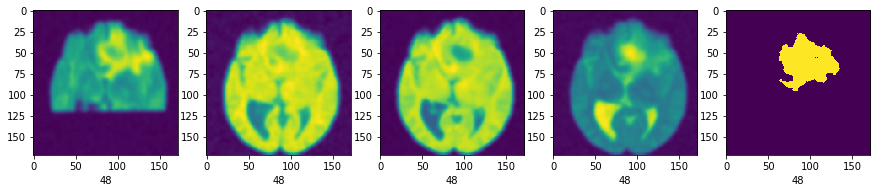

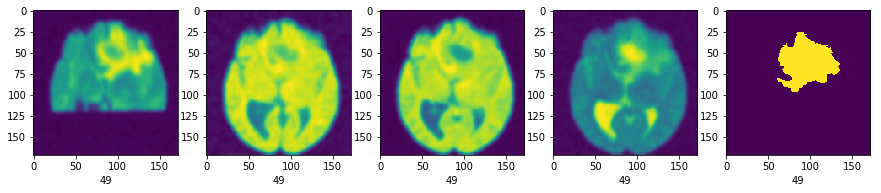

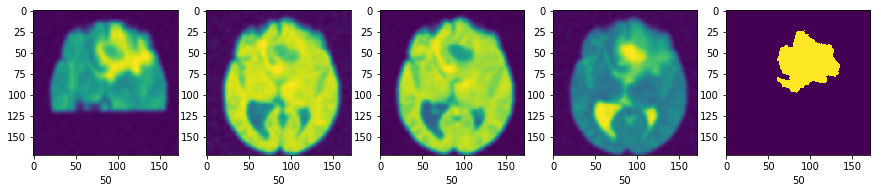

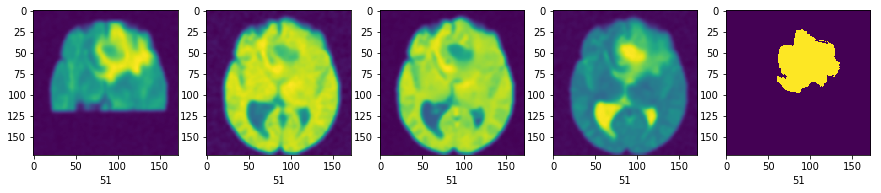

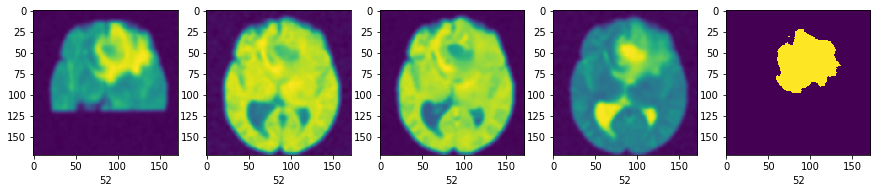

KeyboardInterrupt: 

In [29]:
# single_patient_two(a['img'],a['seg_orig'])

0


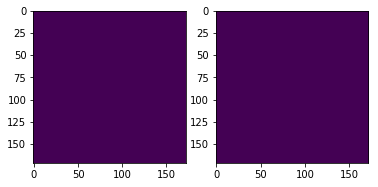

1


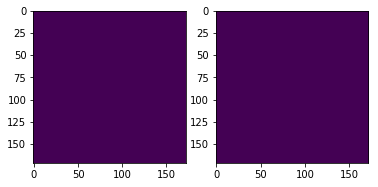

2


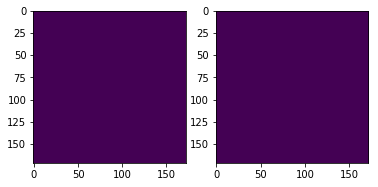

3


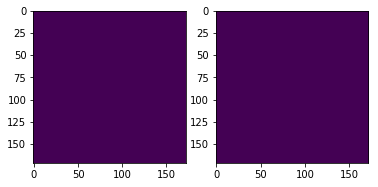

4


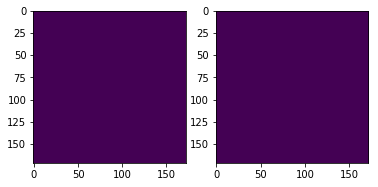

5


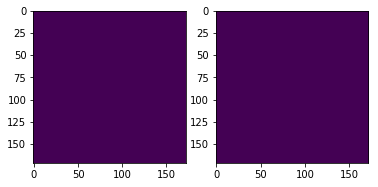

6


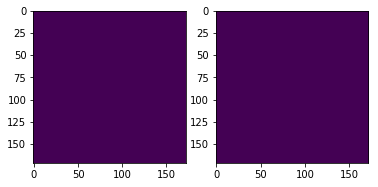

7


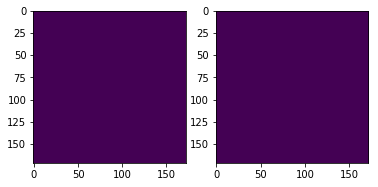

8


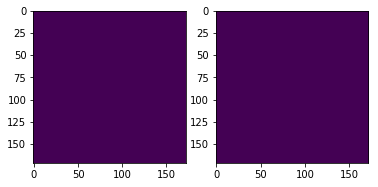

9


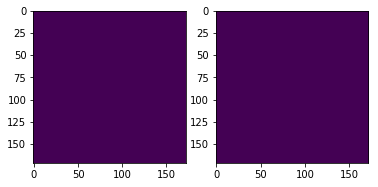

10


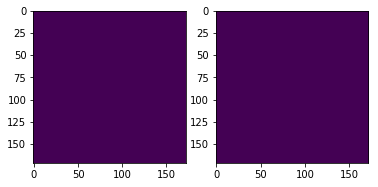

11


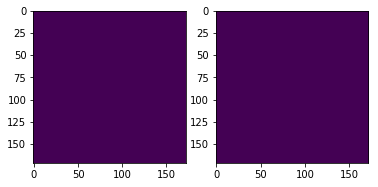

12


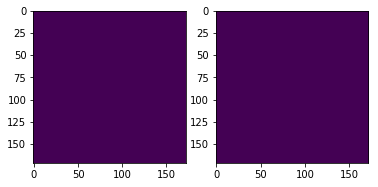

13


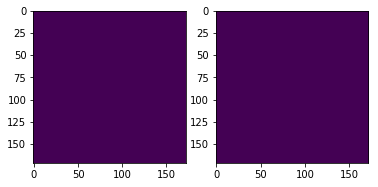

14


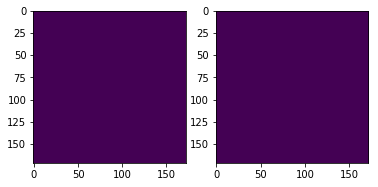

15


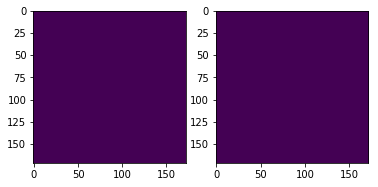

16


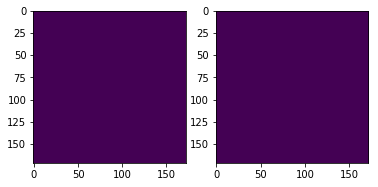

17


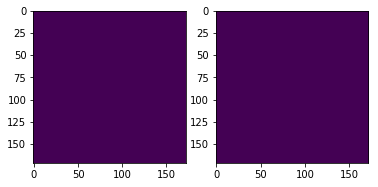

18


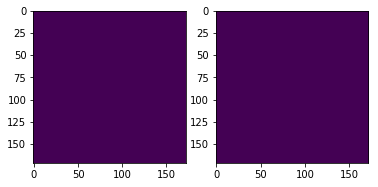

19


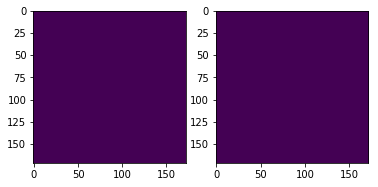

20


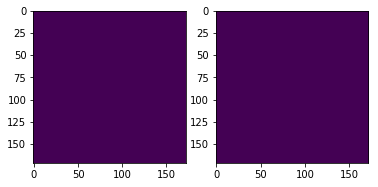

21


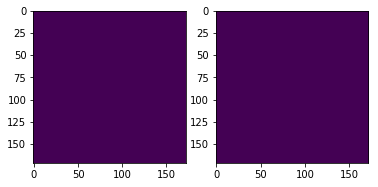

22


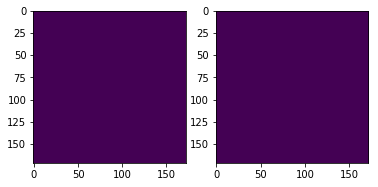

23


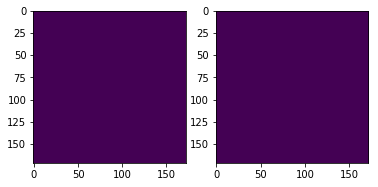

24


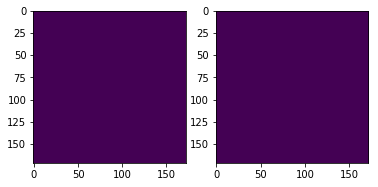

25


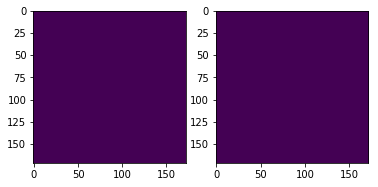

26


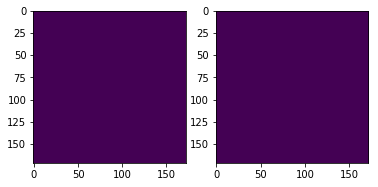

27


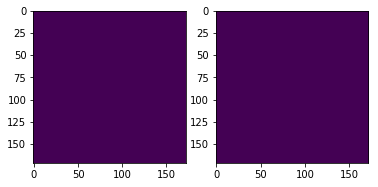

28


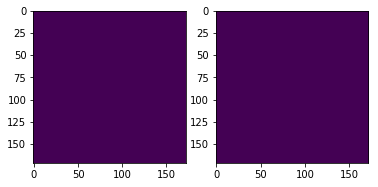

29


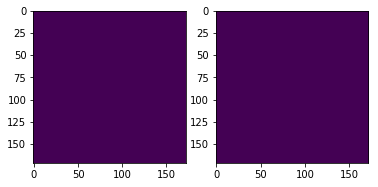

30


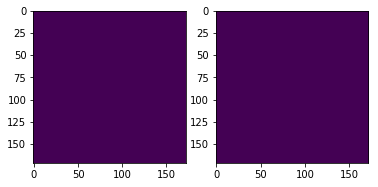

31


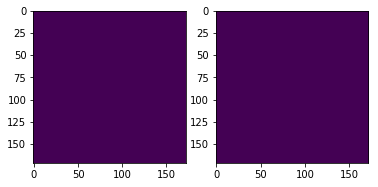

32


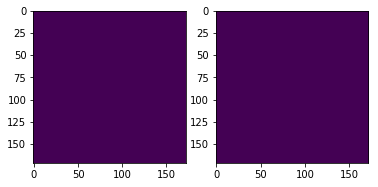

33


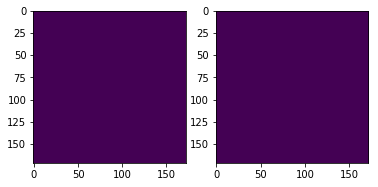

34


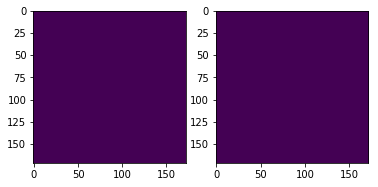

35


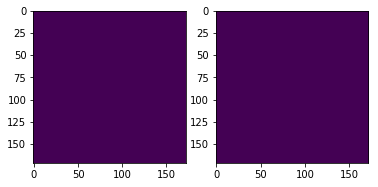

36


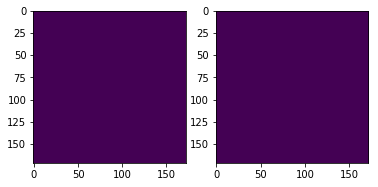

37


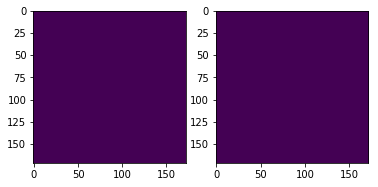

38


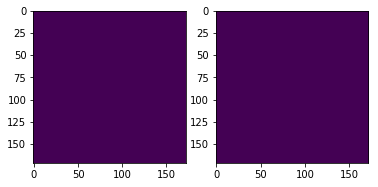

39


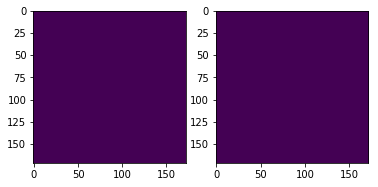

40


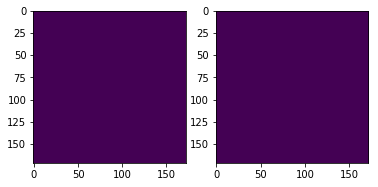

41


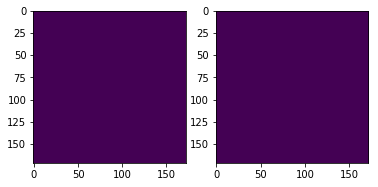

42


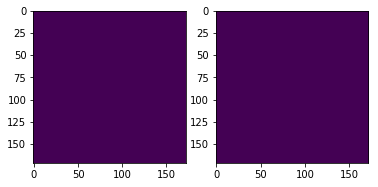

43


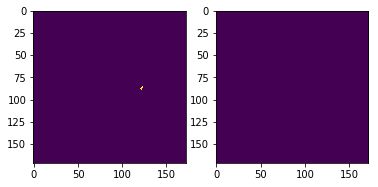

44


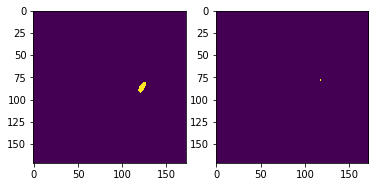

45


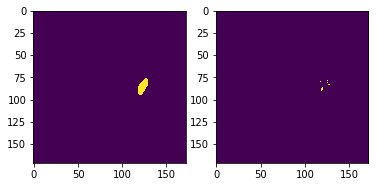

46


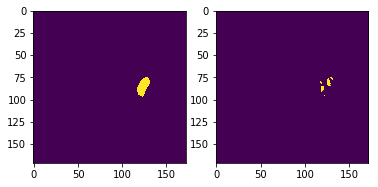

47


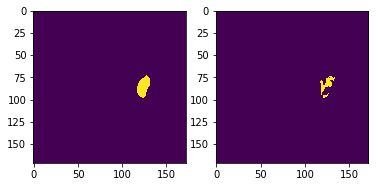

48


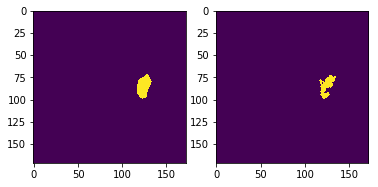

49


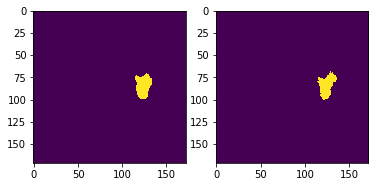

50


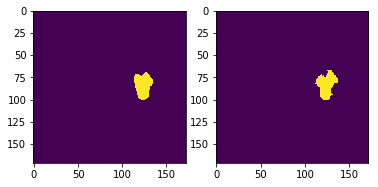

51


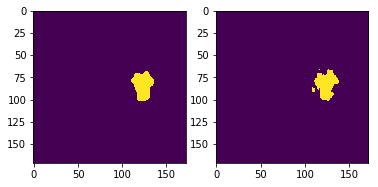

52


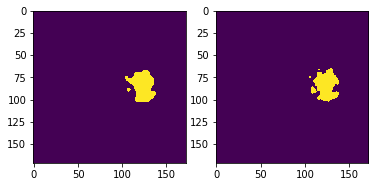

53


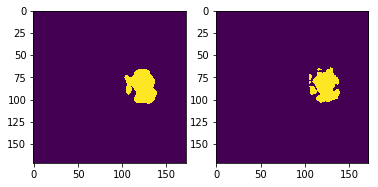

54


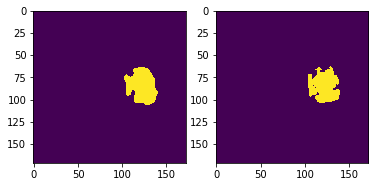

55


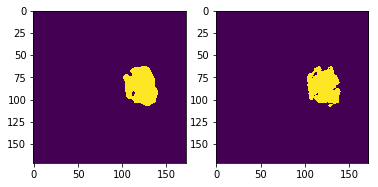

56


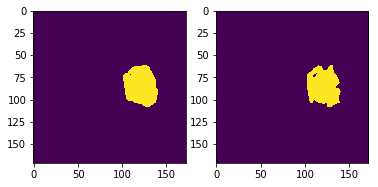

57


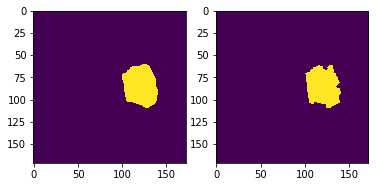

58


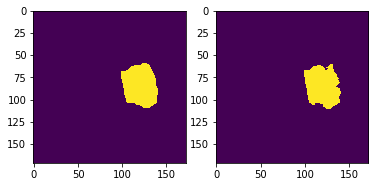

59


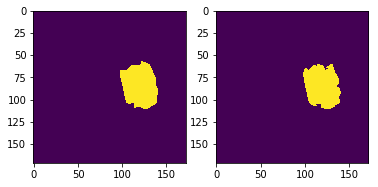

60


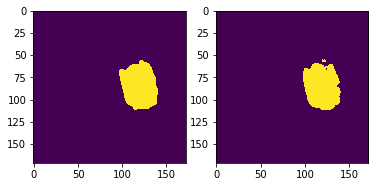

61


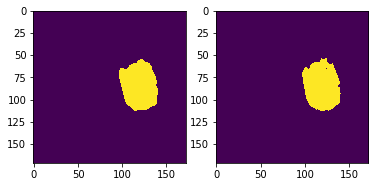

62


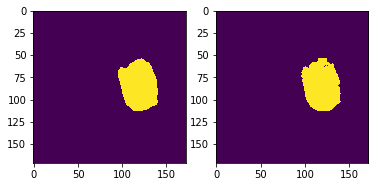

63


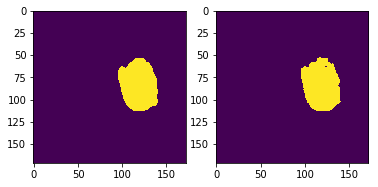

64


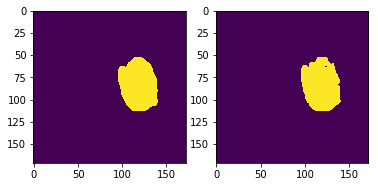

65


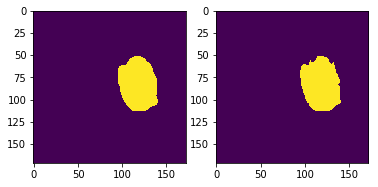

66


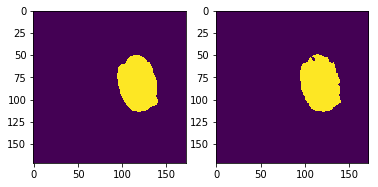

67


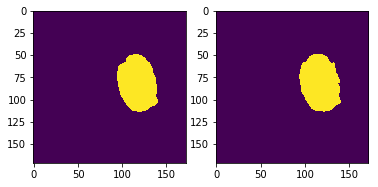

68


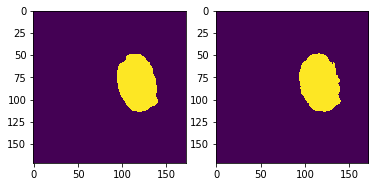

69


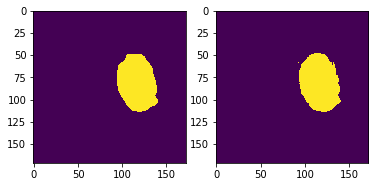

70


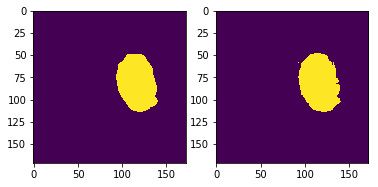

71


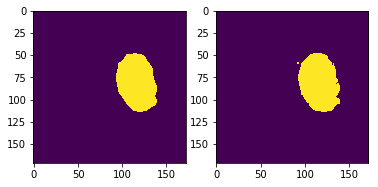

72


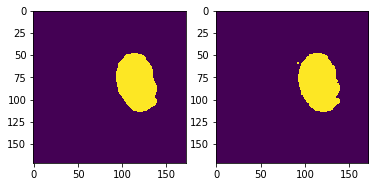

73


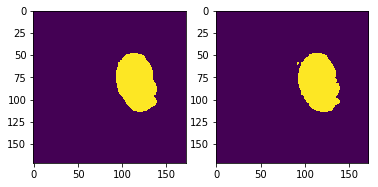

74


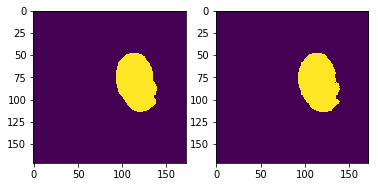

75


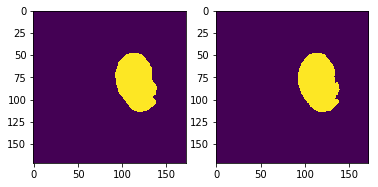

76


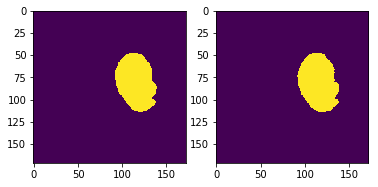

77


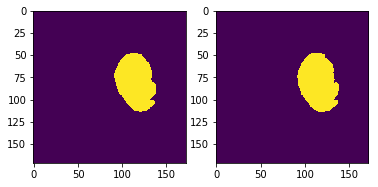

78


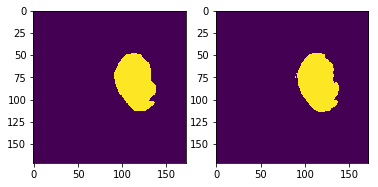

79


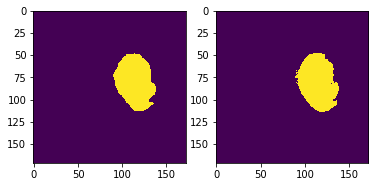

80


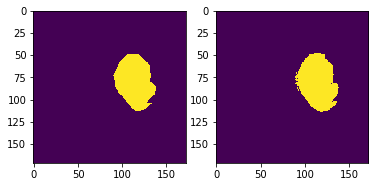

81


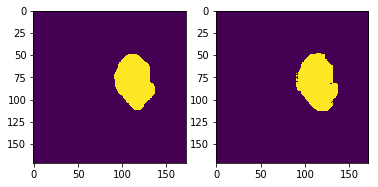

82


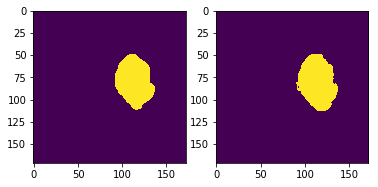

83


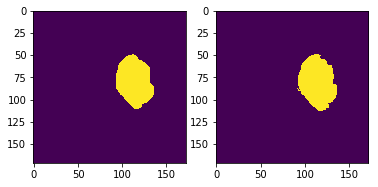

84


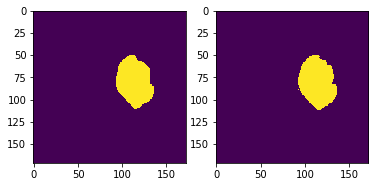

85


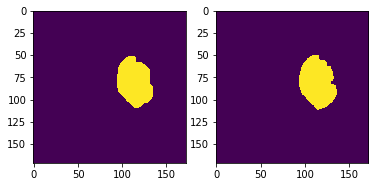

86


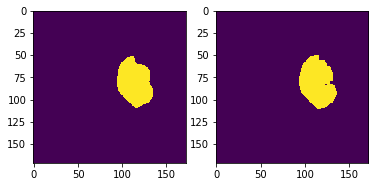

87


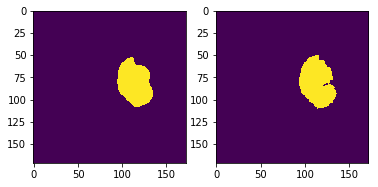

88


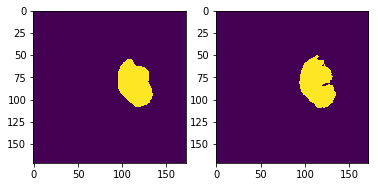

89


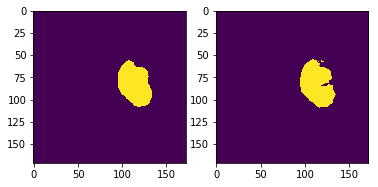

90


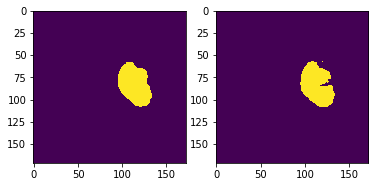

91


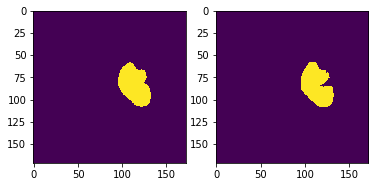

92


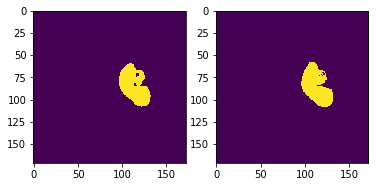

93


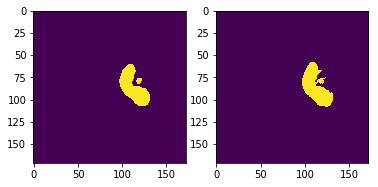

94


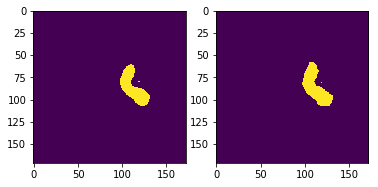

95


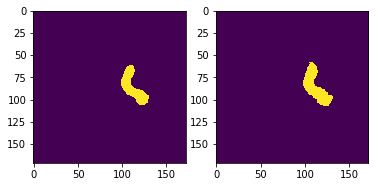

96


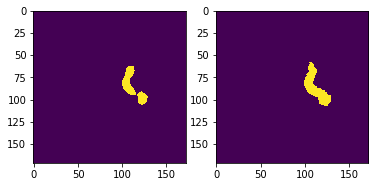

97


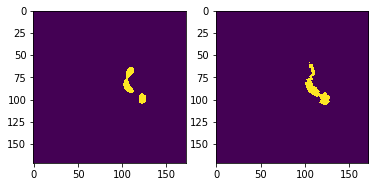

98


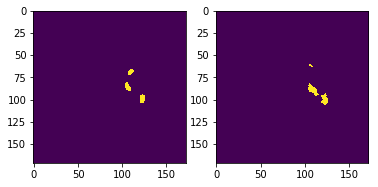

99


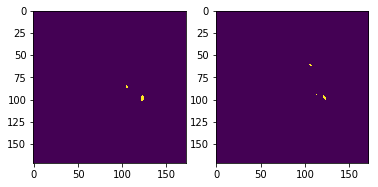

100


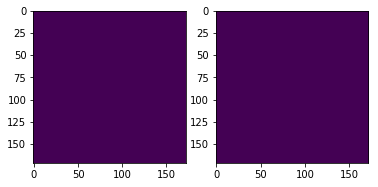

101


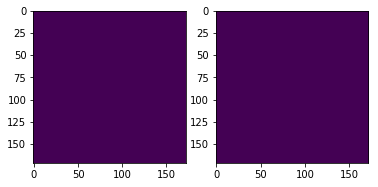

102


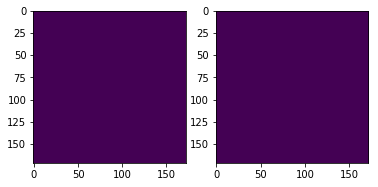

103


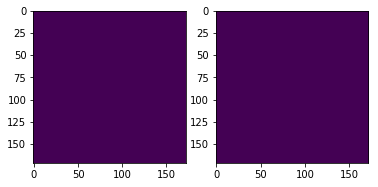

104


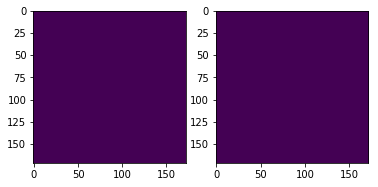

105


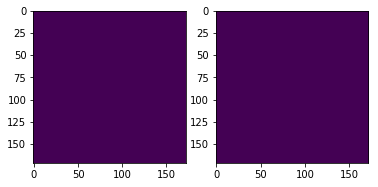

106


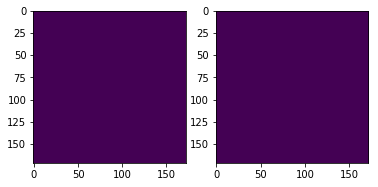

107


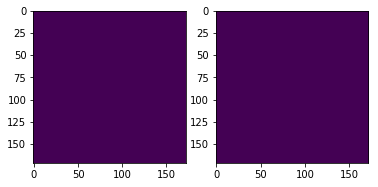

108


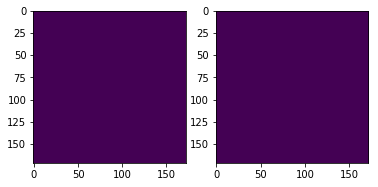

109


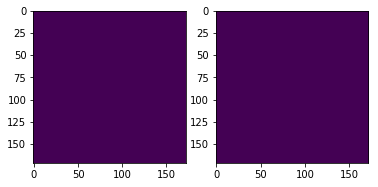

110


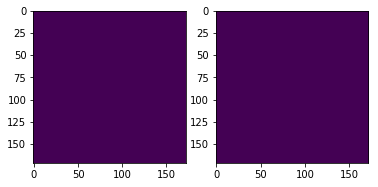

111


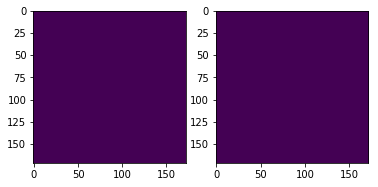

112


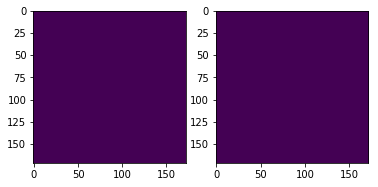

113


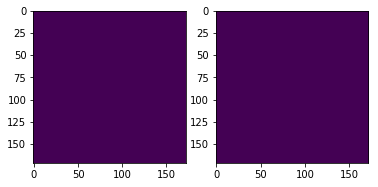

114


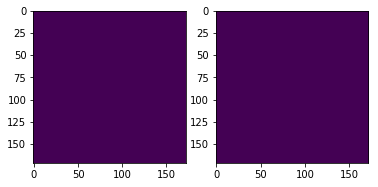

115


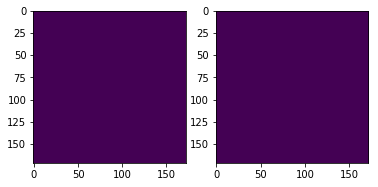

116


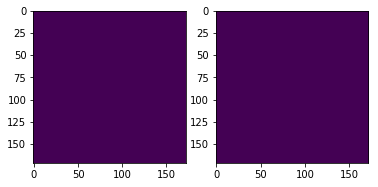

117


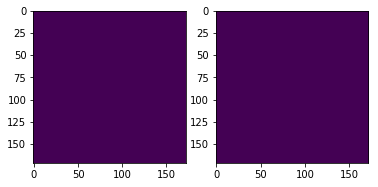

118


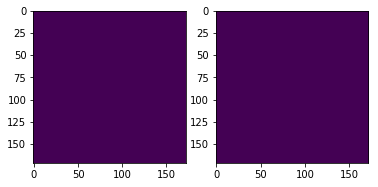

119


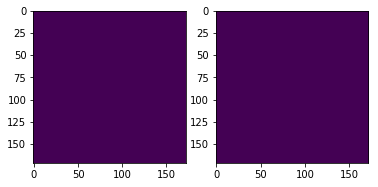

In [38]:
for i in range(0,120):
    print(i)
    plt.subplot(1,2,1)
    plt.imshow(output[:,:,i].cpu().detach())

    plt.subplot(1,2,2)
    plt.imshow(a['seg_orig'][:,:,i])

    plt.show()

In [41]:
o=output.unsqueeze(0)
non_zero = (o!=0).nonzero()  # Contains non-zero indices for all 4 dims
h_min = non_zero[:, 2].min()
h_max = non_zero[:, 2].max()
w_min = non_zero[:, 3].min()
w_max = non_zero[:, 3].max()

In [32]:
o=output.unsqueeze(0)
print(o.size())

non_zero = (o!=0).nonzero()  # Contains non-zero indices for all 4 dims
h_min = non_zero[:, 1].min().cpu().item()
h_max = non_zero[:, 1].max().cpu().item()
w_min = non_zero[:, 2].min().cpu().item()
w_max = non_zero[:, 2].max().cpu().item()
d_min = non_zero[:, 3].min().cpu().item()
d_max = non_zero[:, 3].max().cpu().item()

torch.Size([1, 172, 172, 128])


In [34]:
h_min,h_max,w_min,w_max,d_min,d_max

(48, 114, 91, 140, 43, 99)

In [ ]:
# ('Train: ', 'Brats18_TCIA08_218_1') (78, 169, 77, 136, 38, 113, 0.9432150721549988)

# ('dims', 49, 113, 32, 80, 44, 99)
# ('sizes', 96, 64, 48)
# ('indexing', 33, 129, 8, 104)
# ('mids', 81, 56)
# ((172, 172, 128), torch.Size([172, 172, 512, 1]), 'concat')
# (torch.Size([96, 64, 512, 1]), 's1')
# (torch.Size([96, 64, 512, 1]), 's2')
# (torch.Size([96, 64, 512, 1]), 's3')
# ((96, 64, 128), torch.Size([96, 64, 512, 1]), 's4')
# ('flair2', torch.Size([96, 64, 128]))

#tensor(48, device='cuda:0'),
#  tensor(114, device='cuda:0'),
#  tensor(91, device='cuda:0'),
#  tensor(139, device='cuda:0'),
#  tensor(27, device='cuda:0'),
#  tensor(83, device='cuda:0'))


('Train: ', 'Brats18_TCIA08_218_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA08_218_1
torch.Size([1, 172, 172, 128])
(48, 114, 32, 80, 43, 99, 0.9319829344749451)

In [6]:
dsi=iter(BraTS_FLAIR(csv_dir,hgg_dir))
model=UNet().cuda()
my_dict={}
soft_max=torch.nn.Softmax(dim=1)


model_load=torch.load('/home/Drive3/rahul/unet_cas_opt-0.11|144',map_location='cpu')['state_dict']  # get saved weights
model.load_state_dict(model_load) 
for i in range(200):
    a=next(dsi)
    
    eg_name=a['eg_name']
    gg,b,pred=model(a['img'].unsqueeze(0).float().cuda())
    
    soft_mask=soft_max(pred)
    print(soft_mask.size())
    arg=torch.argmax(soft_mask,1)
    arg.size()
    output=arg#.squeeze(0)
    s1=1-dice_loss_classes(soft_mask, a['mask'].unsqueeze(0).float().cuda())[1] # dice score of c2

    print(eg_name)
    
    o=output#.unsqueeze(0)
    print(o.size())

    non_zero = (o!=0).nonzero()  # Contains non-zero indices for all 4 dims
    h_min = non_zero[:, 1].min().cpu().item()
    h_max = non_zero[:, 1].max().cpu().item()
    w_min = non_zero[:, 2].min().cpu().item()
    w_max = non_zero[:, 2].max().cpu().item()
    d_min = non_zero[:, 3].min().cpu().item()
    d_max = non_zero[:, 3].max().cpu().item()

    print(h_min,h_max,w_min,w_max,d_min,d_max, s1.cpu().item())
    
    my_dict[eg_name]=[h_min,h_max,w_min,w_max,d_min,d_max, s1.cpu().item()]
    print(i)

    

('Train: ', 'Brats18_CBICA_ARZ_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_CBICA_ARZ_1
torch.Size([1, 172, 172, 128])
(60, 105, 78, 120, 15, 67, 0.6732432246208191)
0
('Train: ', 'Brats18_CBICA_AQV_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_CBICA_AQV_1
torch.Size([1, 172, 172, 128])
(97, 146, 34, 90, 44, 95, 0.9008996486663818)
1
('Train: ', 'Brats18_TCIA08_278_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA08_278_1
torch.Size([1, 172, 172, 128])
(96, 153, 29, 79, 28, 78, 0.8847483992576599)
2
('Train: ', 'Brats18_TCIA03_338_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA03_338_1
torch.Size([1, 172, 172, 128])
(123, 168, 39, 73, 18, 57, 0.8769822120666504)
3
('Train: ', 'Brats18_TCIA02_374_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA02_374_1
torch.Size([1, 172, 172, 128])
(18, 97, 85, 144, 40, 107, 0.9435624480247498)
4
('Train: ', 'Brats18_TCIA10_442_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA10_442_1
torch.Size([1, 172, 172, 128])
(56, 130, 11, 63, 46, 114, 0.

torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA09_177_1
torch.Size([1, 172, 172, 128])
(63, 133, 46, 92, 62, 109, 0.8073863387107849)
48
('Train: ', 'Brats18_CBICA_AQN_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_CBICA_AQN_1
torch.Size([1, 172, 172, 128])
(74, 127, 80, 109, 80, 124, 0.8854205012321472)
49
('Train: ', 'Brats18_TCIA12_480_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA12_480_1
torch.Size([1, 172, 172, 128])
(27, 119, 17, 95, 28, 104, 0.9390560984611511)
50
('Train: ', 'Brats18_TCIA10_175_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA10_175_1
torch.Size([1, 172, 172, 128])
(40, 137, 80, 150, 26, 104, 0.9167454838752747)
51
('Train: ', 'Brats18_TCIA10_330_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA10_330_1
torch.Size([1, 172, 172, 128])
(70, 144, 22, 75, 15, 66, 0.9313321709632874)
52
('Train: ', 'Brats18_TCIA10_637_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA10_637_1
torch.Size([1, 172, 172, 128])
(17, 141, 26, 116, 33, 109, 0.8849075436592102)
53
('Tr

torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA10_152_1
torch.Size([1, 172, 172, 128])
(53, 114, 26, 87, 48, 109, 0.9391780495643616)
96
('Train: ', 'Brats18_TCIA02_226_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA02_226_1
torch.Size([1, 172, 172, 128])
(64, 125, 98, 139, 30, 83, 0.8512889742851257)
97
('Train: ', 'Brats18_2013_20_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_2013_20_1
torch.Size([1, 172, 172, 128])
(20, 116, 35, 113, 44, 123, 0.9326109886169434)
98
('Train: ', 'Brats18_CBICA_AAG_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_CBICA_AAG_1
torch.Size([1, 172, 172, 128])
(52, 122, 101, 153, 14, 67, 0.8845831751823425)
99
('Train: ', 'Brats18_TCIA10_130_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA10_130_1
torch.Size([1, 172, 172, 128])
(54, 98, 43, 78, 77, 118, 0.9001245498657227)
100
('Train: ', 'Brats18_CBICA_ANP_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_CBICA_ANP_1
torch.Size([1, 172, 172, 128])
(96, 162, 57, 136, 39, 88, 0.8039621114730835)
101
('Train: ',

torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA10_310_1
torch.Size([1, 172, 172, 128])
(56, 110, 98, 136, 68, 114, 0.8786813616752625)
144
('Train: ', 'Brats18_TCIA13_650_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA13_650_1
torch.Size([1, 172, 172, 128])
(108, 142, 58, 88, 1, 44, 0.85126793384552)
145
('Train: ', 'Brats18_TCIA01_425_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA01_425_1
torch.Size([1, 172, 172, 128])
(56, 114, 25, 71, 14, 58, 0.8364384770393372)
146
('Train: ', 'Brats18_TCIA02_208_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA02_208_1
torch.Size([1, 172, 172, 128])
(108, 156, 94, 141, 51, 98, 0.8907069563865662)
147
('Train: ', 'Brats18_CBICA_ATX_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_CBICA_ATX_1
torch.Size([1, 172, 172, 128])
(88, 127, 85, 122, 53, 95, 0.8569220304489136)
148
('Train: ', 'Brats18_CBICA_APZ_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_CBICA_APZ_1
torch.Size([1, 172, 172, 128])
(53, 129, 92, 141, 40, 103, 0.8756081461906433)
149
('T

torch.Size([1, 2, 172, 172, 128])
Brats18_CBICA_AAB_1
torch.Size([1, 172, 172, 128])
(46, 152, 12, 93, 31, 107, 0.907331645488739)
192
('Train: ', 'Brats18_TCIA10_420_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA10_420_1
torch.Size([1, 172, 172, 128])
(19, 84, 75, 107, 12, 67, 0.8299161791801453)
193
('Train: ', 'Brats18_CBICA_APR_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_CBICA_APR_1
torch.Size([1, 172, 172, 128])
(61, 131, 77, 127, 60, 117, 0.9137817025184631)
194
('Train: ', 'Brats18_TCIA08_242_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA08_242_1
torch.Size([1, 172, 172, 128])
(78, 169, 77, 136, 38, 113, 0.9432194232940674)
195
('Train: ', 'Brats18_CBICA_AXW_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_CBICA_AXW_1
torch.Size([1, 172, 172, 128])
(59, 133, 28, 69, 56, 99, 0.8949493765830994)
196
('Train: ', 'Brats18_TCIA06_211_1')
torch.Size([1, 2, 172, 172, 128])
Brats18_TCIA06_211_1
torch.Size([1, 172, 172, 128])
(55, 141, 33, 91, 43, 118, 0.8972922563552856)
197
('Tr

In [25]:
output.size()

torch.Size([172, 172, 128])

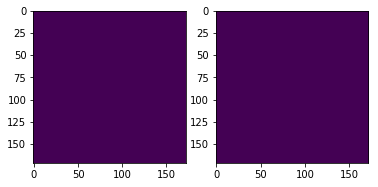

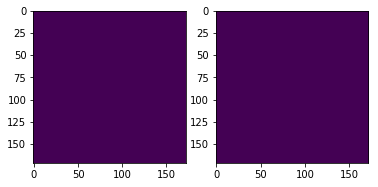

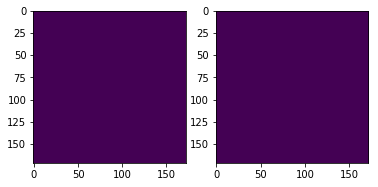

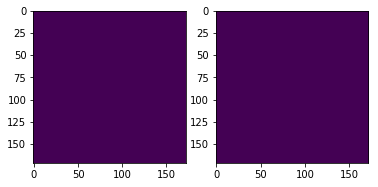

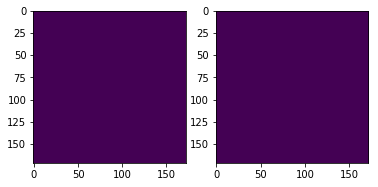

...

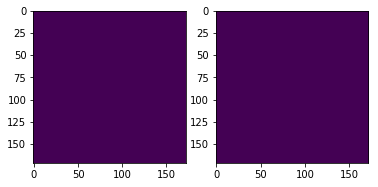

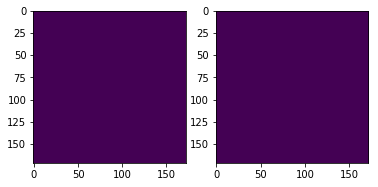

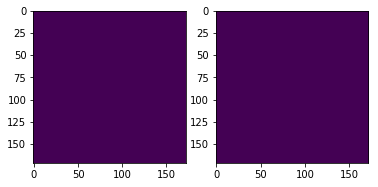

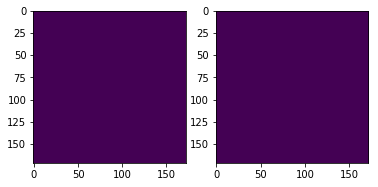

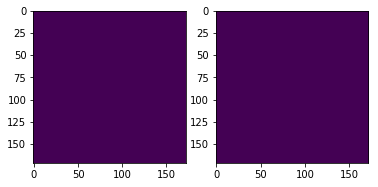

In [15]:
for i in range(0,120):
    plt.subplot(1,2,1)
    plt.imshow(output[:,:,i].cpu().detach())

    plt.subplot(1,2,2)
    plt.imshow(a['seg_orig'][:,:,i])

    plt.show()

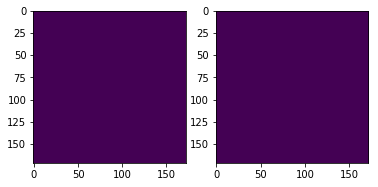

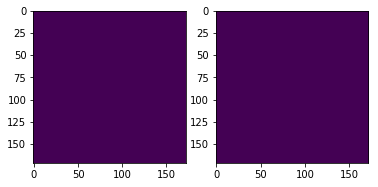

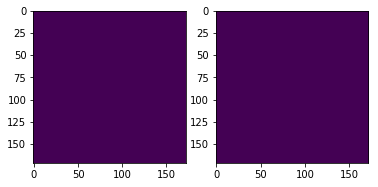

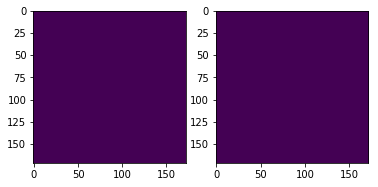

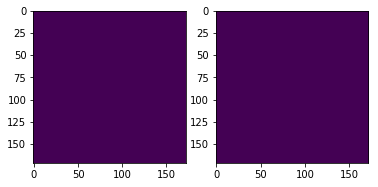

...

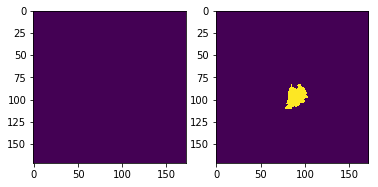

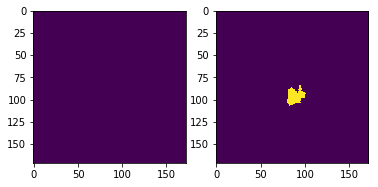

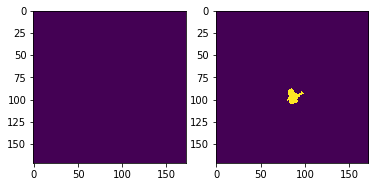

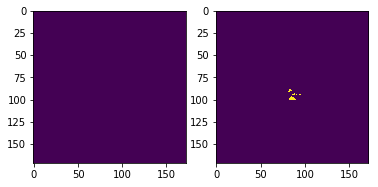

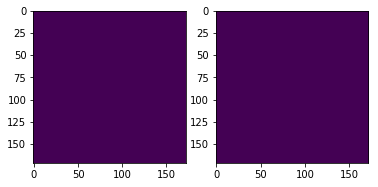

In [22]:
for i in range(0,120):
    plt.subplot(1,2,1)
    plt.imshow(output[:,:,i].cpu().detach())

    plt.subplot(1,2,2)
    plt.imshow(a['seg_orig'][:,:,i])

    plt.show()

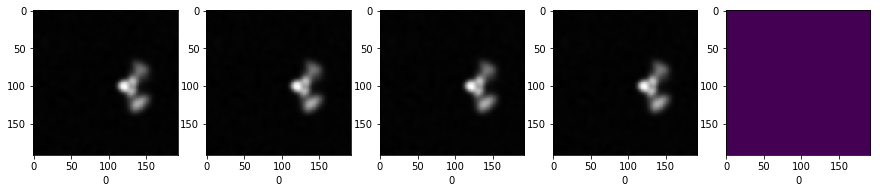

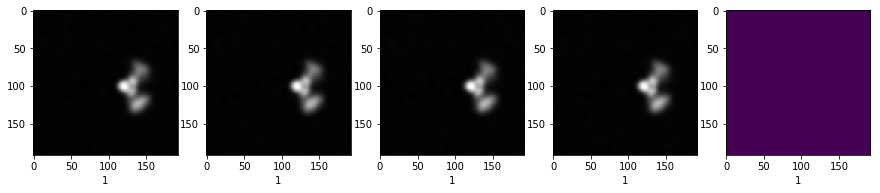

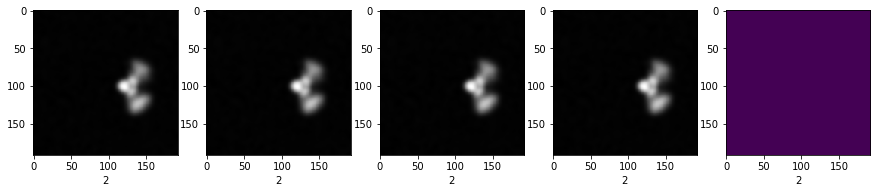

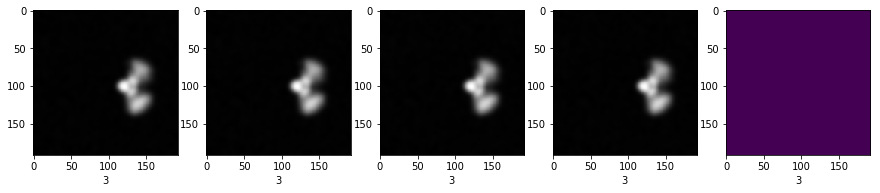

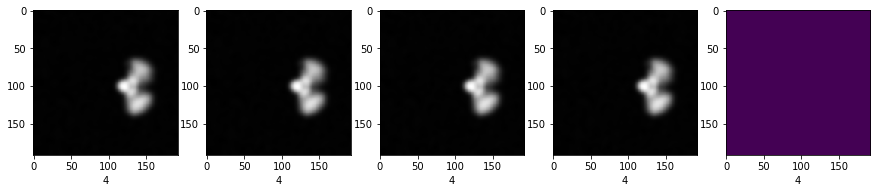

...

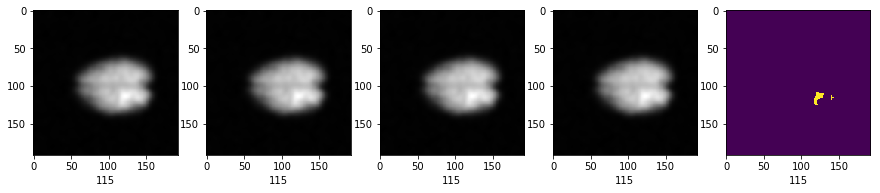

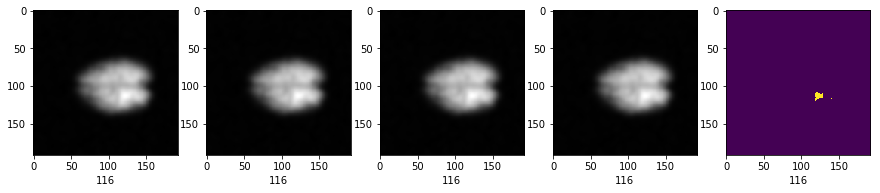

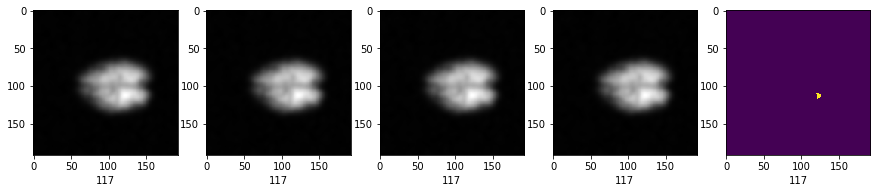

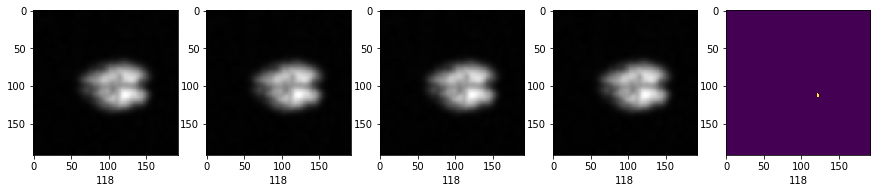

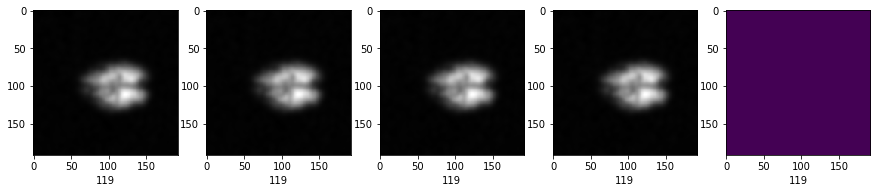

In [49]:
single_patient_two(a['img'],a['seg_orig'])

In [45]:
a['seg_orig'].size()

torch.Size([192, 192, 128])

In [51]:
model2=UNet().cuda()

In [54]:
model_dicts2=torch.load('unet1024trans_hist-1.5|136',map_location='cpu')


model_load=torch.load('unet1024trans_hist-1.5|136',map_location='cpu')['state_dict']  # get saved weights
model2.load_state_dict(model_load) 

In [64]:
pred2=model2(a['img'].unsqueeze(0).float().cuda())
soft_mask2=soft_max(pred2)

In [65]:
arg2=torch.argmax(soft_mask2,1)
output2=arg2.squeeze(0)

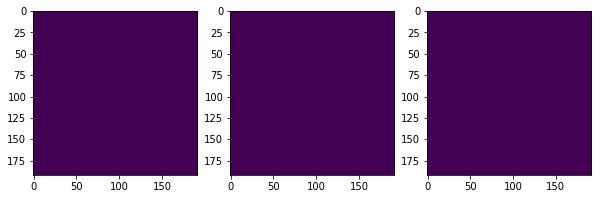

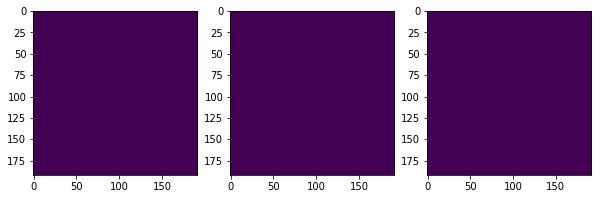

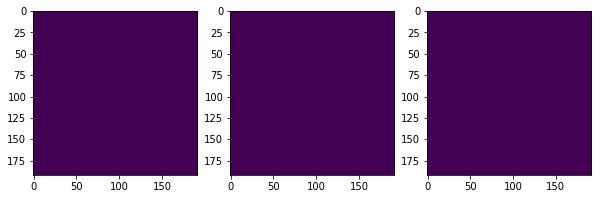

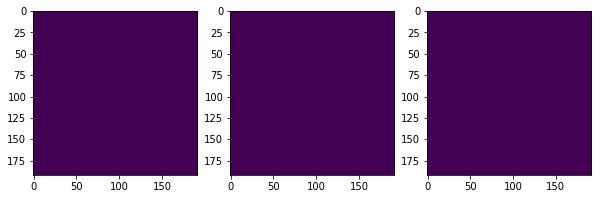

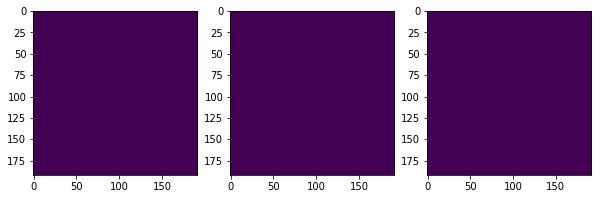

...

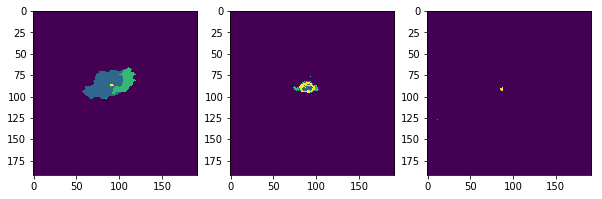

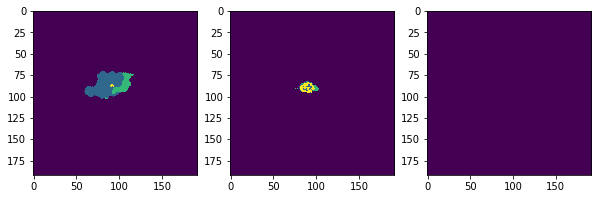

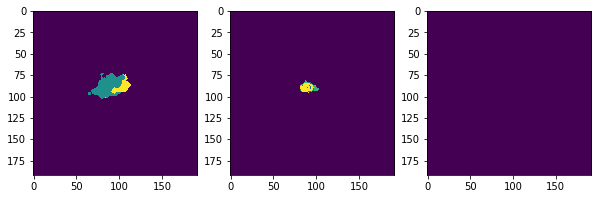

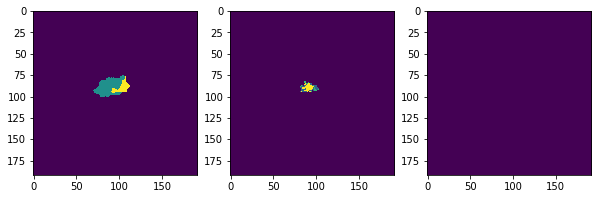

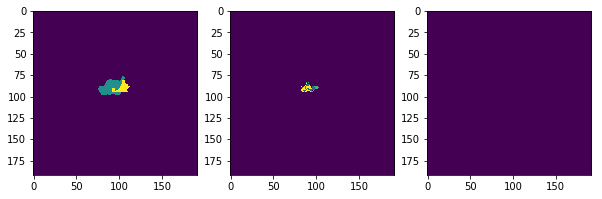

In [66]:
for i in range(0,120):
    fig=plt.figure(figsize=(10,10))
    plt.subplot(1,3,1)
    plt.imshow(output[:,:,i])

    plt.subplot(1,3,2)
    plt.imshow(a['seg_orig'][:,:,i])
    
    plt.subplot(1,3,3)
    plt.imshow(output2[:,:,i])

    plt.show()

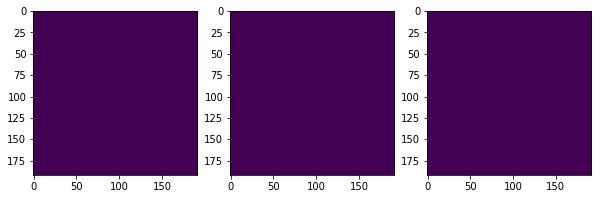

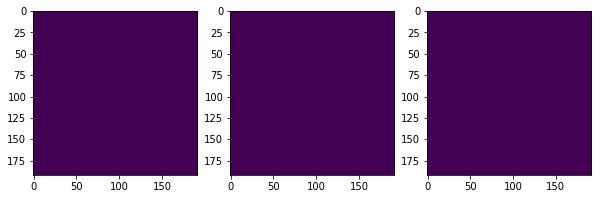

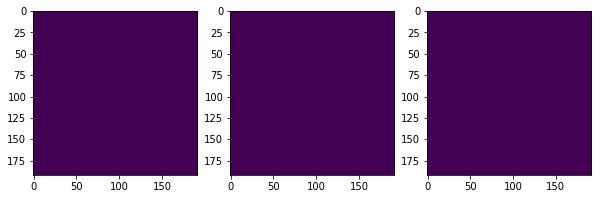

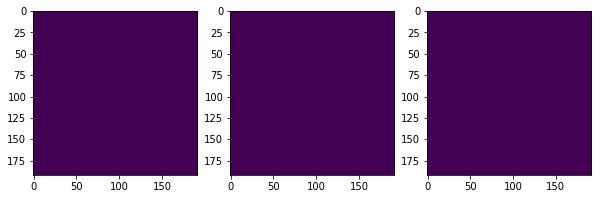

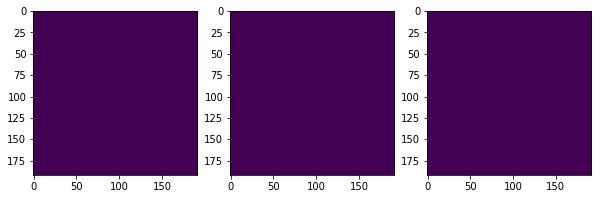

...

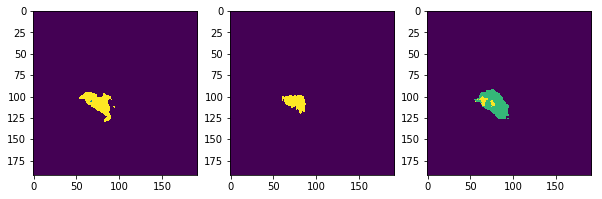

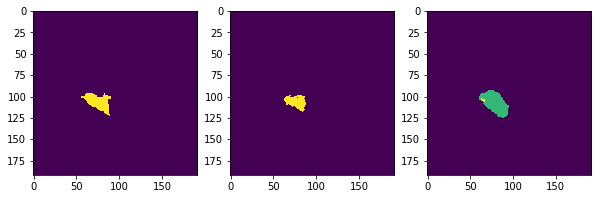

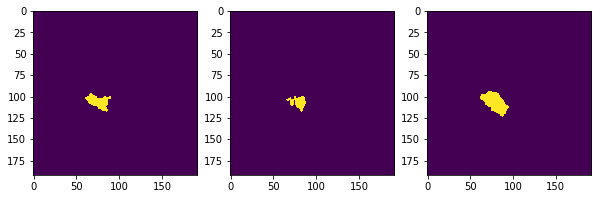

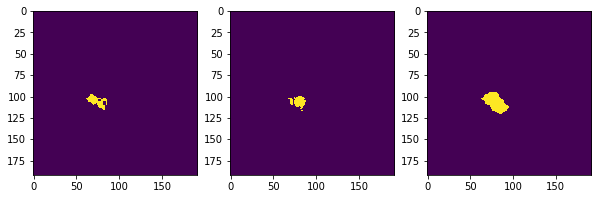

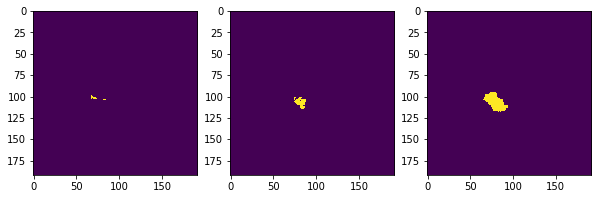

In [16]:
for i in range(0,120):
    fig=plt.figure(figsize=(10,10))
    plt.subplot(1,3,1)
    plt.imshow(output[:,:,i])

    plt.subplot(1,3,2)
    plt.imshow(a['seg_orig'][:,:,i])
    
    plt.subplot(1,3,3)
    plt.imshow(output2[:,:,i])

    plt.show()

In [17]:
dice_loss_reg(soft_mask, a['mask'].float().unsqueeze(0).cuda()),dice_loss_reg(soft_mask2, a['mask'].float().unsqueeze(0).cuda())

(tensor(0.5115, device='cuda:0', grad_fn=<AddBackward>),
 tensor(0.5105, device='cuda:0', grad_fn=<AddBackward>))

In [12]:
d=np.load('/home/Drive3/rahul/dict1.npy')

In [14]:
for e in d.keys():
    print(e)
    print(d[keys][0], d[keys][1] , d[keys][2] , d[keys][3])

AttributeError: 'numpy.ndarray' object has no attribute 'keys'

In [20]:
lisr2=5

In [20]:

def single_patient_two(image,seg,start=0,end=120,patient=None,rows=1,cols=5,base=15):
    # to see across modalities of single patient
    # each col is a modality
    
    for i in range(start,end):
        fig = plt.figure(figsize=(15,15))

        plt.subplot(rows,cols,1)
        f=image[0,:,:,start+i]
        plt.imshow(f)
        xlab=str(i)
        plt.xlabel(xlab)

        plt.subplot(rows,cols,2)
        t1=image[1,:,:,start+i]
        plt.imshow(t1)
        xlab=str(i)
        plt.xlabel(xlab)

        plt.subplot(rows,cols,3)
        t1ce=image[2,:,:,start+i]
        plt.imshow(t1ce)
        xlab=str(i)
        plt.xlabel(xlab)


        plt.subplot(rows,cols,4)
        t2=image[3,:,:,start+i]
        plt.imshow(t2)
        xlab=str(i)
        plt.xlabel(xlab)

        
        plt.subplot(rows,cols,5)
        seg_p=seg[:,:,start+i]
        plt.imshow(seg_p)
        xlab=str(i)
        plt.xlabel(xlab)
        plt.show()



In [29]:
import pickle
def load_obj(name ):
    with open('/home/Drive3/rahul/'+ 'dicts'+ '.pkl', 'rb') as f:
        return pickle.load(f)

In [30]:
d=load_obj('s')

In [40]:
l=[]
for e in d.keys():
    l.append(1-d[e][6])

In [41]:
d

{'Brats18_2013_0_1': [73, 145, 38, 93, 20, 76, 0.17275559902191162],
 'Brats18_2013_12_1': [19, 122, 25, 107, 16, 87, 0.08300542831420898],
 'Brats18_2013_13_1': [119, 157, 94, 131, 32, 71, 0.14388012886047363],
 'Brats18_2013_14_1': [75, 171, 12, 74, 22, 96, 0.06935995817184448],
 'Brats18_2013_15_1': [35, 92, 81, 112, 79, 122, 0.0983005166053772],
 'Brats18_2013_16_1': [69, 143, 94, 144, 32, 89, 0.09537440538406372],
 'Brats18_2013_17_1': [13, 92, 37, 129, 7, 86, 0.073558509349823],
 'Brats18_2013_18_1': [88, 170, 19, 114, 6, 83, 0.09054458141326904],
 'Brats18_2013_19_1': [93, 171, 17, 73, 46, 114, 0.11340600252151489],
 'Brats18_2013_1_1': [87, 132, 25, 56, 26, 66, 0.18775683641433716],
 'Brats18_2013_20_1': [20, 116, 34, 112, 44, 124, 0.06735599040985107],
 'Brats18_2013_21_1': [62, 127, 81, 139, 11, 80, 0.05954045057296753],
 'Brats18_2013_22_1': [45, 162, 76, 152, 15, 92, 0.0726175308227539],
 'Brats18_2013_23_1': [22, 92, 69, 136, 24, 97, 0.06209456920623779],
 'Brats18_2013_24

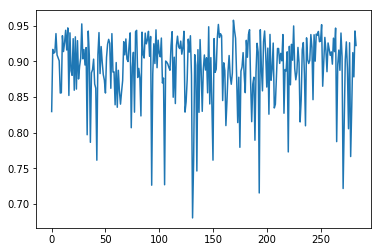

(0.9577849507331848, 0.6803041100502014)


In [42]:
plt.plot(l)
plt.show()
print(max(l),min(l))

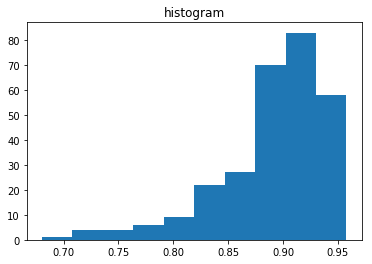

In [43]:
plt.hist(l)#, bins = [0,2.,4,6,8,10]*0.05) 
plt.title("histogram") 
plt.show()

In [46]:
len(l[l<0.85]) / len(l) 

TypeError: object of type 'float' has no len()

In [52]:
l=np.array([l])
l[l<0.85]

array([0.82963032, 0.79702854, 0.78640544, 0.76131374, 0.83910239,
       0.83563668, 0.84002167, 0.80687529, 0.82874227, 0.8234666 ,
       0.72623175, 0.72685289, 0.84971809, 0.84084433, 0.82884139,
       0.84325439, 0.68030411, 0.7609064 , 0.74617946, 0.82852018,
       0.82990324, 0.84026331, 0.83703446, 0.76136756, 0.84506601,
       0.8099106 , 0.84451413, 0.8141166 , 0.77942157, 0.81541187,
       0.78935707, 0.71533376, 0.82588941, 0.83465362, 0.83988369,
       0.8272444 , 0.77291477, 0.81501383, 0.84625447, 0.80961788,
       0.84626895, 0.78738052, 0.72159308, 0.81224316, 0.80551112,
       0.76646578, 0.83488542])

In [53]:
np.mean(l)

0.8908564437862853

In [4]:

def dice_loss(inpu, target):  # [bs,4,96,96,64]
    a=0;b=0;c=0;d=0 
    intersection=0; union=0
    

    ip=inpu[:,0,:,:,:].contiguous().view(-1)
    tar=target[:,0,:,:,:].contiguous().view(-1)
    intersection+=(ip * tar).sum() 
    union+= ip.sum() + tar.sum()
     
    ip=inpu[:,1,:,:,:].contiguous().view(-1)
    tar=target[:,1,:,:,:].contiguous().view(-1)
    intersection+=(ip * tar).sum() 
    union+= ip.sum() + tar.sum()
   
 
    raw_scores=1-2*(intersection/union)
    
    return raw_scores


def dice_loss_classes(inpu, target):  # [bs,4,96,96,64]

    ip=inpu[:,0,:,:,:].contiguous().view(-1)
    tar=target[:,0,:,:,:].contiguous().view(-1)
    intersection=(ip * tar).sum() 
    union= ip.sum() + tar.sum()
    score1=1-2*(intersection/union)
    

    ip=inpu[:,1,:,:,:].contiguous().view(-1)
    tar=target[:,1,:,:,:].contiguous().view(-1)
    intersection=(ip * tar).sum() 
    union= ip.sum() + tar.sum()
    score2=1-2*(intersection/union)
     
    
    return score1,score2


model=UNet().cuda()
model_load=torch.load('/home/Drive3/rahul/unet_cas_opt-0.11|144',map_location='cpu')['state_dict']  # get saved weights
model.load_state_dict(model_load) 

my_dict={}




def train(): 
#     global Lc,Lvc,Lvdc, Lc,Ldc,L,Lv
#     forward_times=counter_t=vis_count=0

    dataset = BraTS_FLAIR(csv_dir,hgg_dir,transform=None,train_size=train_size)
    dataset_val=BraTS_FLAIR_val(csv_dir,hgg_dir)    #val
    data_loader = DataLoader(dataset, batch_size, shuffle=True, num_workers=2)
    val_loader=DataLoader(dataset_val,batch_size_val,shuffle=True, num_workers=2) 
    loaders={'train':data_loader,'val': val_loader}
    
    model.eval()
    
    for e in loaders:
        for idx, batch_data in enumerate(loaders[e]):
            batch_input = Variable(batch_data['img'].float()).cuda()#.to(device)
            batch_gt_mask = Variable(batch_data['mask'].float()).cuda()#.to(device)
            batch_seg_orig=Variable(batch_data['seg_orig']).cuda()#.to(device)
            eg_name=batch_data['eg_name']
            
            gg,b,pred=model(batch_input)
            soft_max=torch.nn.Softmax(dim=1)

            soft_mask=soft_max(pred)
            
            arg=torch.argmax(soft_mask,1)
            a,b=dice_loss_classes(soft_mask, batch_gt_mask) # dice score of c2

            score=1-b
#             o=output.unsqueeze(0)
            print(arg.size())

            non_zero = (arg!=0).nonzero()  # Contains non-zero indices for all 4 dims
            h_min = non_zero[:, 1].min().cpu().item()
            h_max = non_zero[:, 1].max().cpu().item()
            w_min = non_zero[:, 2].min().cpu().item()
            w_max = non_zero[:, 2].max().cpu().item()
            d_min = non_zero[:, 3].min().cpu().item()
            d_max = non_zero[:, 3].max().cpu().item()
            
            print(eg_name)
            print(h_min,h_max,w_min,w_max,d_min,d_max,score.cpu().item())
            
            my_dict[eg_name[0]]=[h_min,h_max,w_min,w_max,d_min,d_max , score.cpu().item() ]
                    
            print(idx)
            torch.cuda.empty_cache()
    return(my_dict)
                
 

In [5]:
my_dict=train()

('Train: ', 'Brats18_TCIA12_480_1')
('Train: ', 'Brats18_TCIA02_374_1')
('Train: ', 'Brats18_TCIA01_412_1')
('Train: ', 'Brats18_TCIA01_425_1')
torch.Size([1, 172, 172, 128])
['Brats18_TCIA12_480_1']
(26, 121, 72, 153, 24, 104, 0.9241914749145508)
0
torch.Size([1, 172, 172, 128])
['Brats18_TCIA02_374_1']
(18, 97, 84, 144, 40, 106, 0.9379054307937622)
1
('Train: ', 'Brats18_CBICA_AAP_1')
torch.Size([1, 172, 172, 128])
('Train: ', 'Brats18_CBICA_AQA_1')
['Brats18_TCIA01_412_1']
(77, 167, 17, 74, 33, 107, 0.8886807560920715)
2
torch.Size([1, 172, 172, 128])
['Brats18_TCIA01_425_1']
(55, 107, 99, 146, 14, 55, 0.8422176837921143)
3
('Train: ', 'Brats18_TCIA08_242_1')
torch.Size([1, 172, 172, 128])
('Train: ', 'Brats18_TCIA01_131_1')
['Brats18_CBICA_AAP_1']
(94, 169, 88, 140, 40, 105, 0.9263109564781189)
4
torch.Size([1, 172, 172, 128])
['Brats18_CBICA_AQA_1']
(107, 158, 101, 134, 21, 55, 0.8749511241912842)
5
('Train: ', 'Brats18_TCIA08_218_1')
torch.Size([1, 172, 172, 128])
('Train: ', 'Br

('Train: ', 'Brats18_TCIA12_101_1')
('Train: ', 'Brats18_TCIA02_118_1')
torch.Size([1, 172, 172, 128])
['Brats18_TCIA10_282_1']
(15, 123, 47, 112, 9, 85, 0.8620362281799316)
58
torch.Size([1, 172, 172, 128])
['Brats18_TCIA08_234_1']
(86, 151, 100, 153, 26, 91, 0.9272371530532837)
59
('Train: ', 'Brats18_2013_20_1')
('Train: ', 'Brats18_TCIA02_331_1')
torch.Size([1, 172, 172, 128])
['Brats18_TCIA02_118_1']
(75, 171, 20, 96, 37, 101, 0.9178259968757629)
60
torch.Size([1, 172, 172, 128])
['Brats18_TCIA12_101_1']
(25, 88, 21, 65, 34, 102, 0.8019755482673645)
61
('Train: ', 'Brats18_CBICA_BHK_1')
('Train: ', 'Brats18_CBICA_APR_1')
torch.Size([1, 172, 172, 128])
['Brats18_TCIA02_331_1']
(115, 171, 79, 127, 22, 103, 0.8836790323257446)
62
torch.Size([1, 172, 172, 128])
['Brats18_2013_20_1']
(20, 115, 58, 136, 3, 82, 0.9331710934638977)
63
('Train: ', 'Brats18_TCIA13_618_1')
('Train: ', 'Brats18_TCIA10_351_1')
torch.Size([1, 172, 172, 128])
['Brats18_CBICA_APR_1']
(60, 130, 43, 107, 60, 118, 0

torch.Size([1, 172, 172, 128])
['Brats18_CBICA_BHB_1']
(66, 127, 9, 37, 16, 53, 0.7991299629211426)
116
('Train: ', 'Brats18_TCIA10_629_1')
torch.Size([1, 172, 172, 128])
['Brats18_TCIA10_449_1']
(90, 150, 17, 56, 64, 108, 0.9437402486801147)
117
('Train: ', 'Brats18_TCIA13_615_1')
torch.Size([1, 172, 172, 128])
['Brats18_TCIA05_478_1']
(20, 115, 24, 99, 46, 114, 0.9428072571754456)
118
('Train: ', 'Brats18_TCIA03_199_1')
torch.Size([1, 172, 172, 128])
['Brats18_TCIA10_629_1']
(131, 171, 86, 133, 47, 93, 0.8320613503456116)
119
('Train: ', 'Brats18_TCIA08_162_1')
torch.Size([1, 172, 172, 128])
['Brats18_TCIA13_615_1']
(98, 169, 74, 123, 34, 113, 0.9302971363067627)
120
('Train: ', 'Brats18_2013_22_1')
torch.Size([1, 172, 172, 128])
['Brats18_TCIA03_199_1']
(12, 99, 25, 99, 41, 119, 0.9410577416419983)
121
('Train: ', 'Brats18_2013_19_1')
torch.Size([1, 172, 172, 128])
['Brats18_TCIA08_162_1']
(99, 170, 75, 121, 43, 108, 0.9382885694503784)
122
('Train: ', 'Brats18_TCIA06_332_1')
torch.

Traceback (most recent call last):
  File "/usr/lib/python2.7/multiprocessing/queues.py", line 268, in _feed
    send(obj)
  File "/home/rahul/vEnv/local/lib/python2.7/site-packages/torch/multiprocessing/queue.py", line 18, in send
    self.send_bytes(buf.getvalue())
IOError: [Errno 32] Broken pipe


KeyboardInterrupt: 

In [ ]:
5
('Train: ', 'Brats18_TCIA08_218_1')
torch.Size([1, 172, 172, 128])
('Train: ', 'Brats18_CBICA_AQT_1')
['Brats18_TCIA08_242_1']
(78, 169, 77, 136, 38, 113, 0.9432150721549988)
6


('Train: ', 'Brats18_TCIA08_113_1')
torch.Size([1, 172, 172, 128])
('Train: ', 'Brats18_TCIA03_474_1')
['Brats18_TCIA08_218_1']
(47, 114, 90, 139, 43, 99, 0.9451758861541748)